## " The replacement of low-income, inner-city working class residents by middle- or upper-class house-holds, either through the market for existing housing or demolition to make way for new up housing construction "

- Median household income
- Home Value
- Rent
- Education
- Displacement of minor communities
- Age

"""

gdf_2010['gen_score'] = \
gdf_2010['Median_Age_norm']* \
(gdf_2010['Total_Bachelors_or_higher']/gdf_2010['Total_Population'])* \
(gdf_2010['Total_Houses_Built_2005_to_2010']+gdf_2010['Total_Houses_Built_2000_to_2004'])/gdf_2010['Total_House_Count']* \
(gdf_2010['tot_fams_1-10k']+gdf_2010['tot_fams_1-15k']+gdf_2010['tot_fams_1-25k'])/gdf_2010['total_fams']

"""

# NOTE : <b>ENSURE ALL METRICS ARE ON THE SAME SCALE</b>


In [100]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

pd.set_option('max_row',50)

# Dataset Created
 - g2010.csv - neighbourhood snapshot of collective 2010 data
 - g2019.csv - neighbourhood snapshot of collective 2019 data


In [ ]:
#Read CSV files
g2010 = pd.read_csv('g2010.csv')
g2019 = pd.read_csv('g2019.csv')

#Create Copy
g2010_df = g2010.copy()
g2019_df = g2019.copy()

In [ ]:
g2019

In [ ]:
dataset = [g2010_df,g2019_df]

In [ ]:
for d in dataset:
    d.drop(d.columns[0],axis=1,inplace=True)

In [ ]:
dataset[0].head()

In [ ]:
mismatch_columns2019 = [ i for i in g2019 if i not in g2010 ]
mismatch_columns2010 = [ i for i in g2010 if i not in g2019 ]

In [ ]:
#Mismatched Columns
print(mismatch_columns2010)
print(mismatch_columns2019)

In [ ]:
dataset[0].columns

# Columns to consider for gentrification score

### Version 1:
Median Age
Total_Bachelors_or_higher
Total_Houses_Built_2005_to_2010
Total_Houses_Built_2000_to_2004
med_monthly_hous_cost
tot_fams_1-10k
tot_fams_1-15k
tot_fams_1-25k




The format of your polygon is WKT, so you have to convert it to shapely Polygon. Following Geopandas docs (https://geopandas.readthedocs.io/en/latest/gallery/create_geopandas_from_pandas.html) do following

In [ ]:
#Set Geometry for 2010 dataset
dataset[0]['geometry'] = gpd.GeoSeries.from_wkt(dataset[0]['geometry'])
gdf_2010 = gpd.GeoDataFrame(dataset[0],geometry="geometry")

#Set Geometry for 2019 dataset
dataset[1]['geometry'] = gpd.GeoSeries.from_wkt(dataset[1]['geometry'])
gdf_2019 = gpd.GeoDataFrame(dataset[1],geometry="geometry")

In [ ]:
type(gdf_2010)

In [ ]:
gdf_2010.plot()

In [ ]:
gdf_2019.plot()

In [ ]:
dataset[0].columns

# Preprocessing all columns

---
### ' - ' Character present in Median_Age -> replacing with Null
---

In [ ]:
gdf_2010['Median_Age'].value_counts()

In [ ]:
gdf_2010['Median_Age'] = gdf_2010['Median_Age'].replace('-',np.NaN)

In [ ]:
gdf_2010['Median_Age'].isnull().sum()

In [ ]:
#Fill mean for null values in Median Age
gdf_2010['Median_Age'].fillna(gdf_2010['Median_Age'].astype('float').mean(),inplace=True)

In [ ]:
gdf_2010['Median_Age'].isnull().sum()

In [118]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(1,100))
scaler10 = MinMaxScaler(feature_range=(1,10))

In [ ]:
#Normalize Median Age 
gdf_2010['Median_Age'] = gdf_2010['Median_Age'].astype(float)
# gdf_2010['Median_Age'] = (gdf_2010['Median_Age'] - gdf_2010['Median_Age'].mean())/gdf_2010['Median_Age'].std() #gives negative valus too
#gdf_2010['Median_Age']  = (gdf_2010['Median_Age']-gdf_2010['Median_Age'].min())/(gdf_2010['Median_Age'].max()-gdf_2010['Median_Age'].min())
gdf_2010['Median_Age'] = scaler.fit_transform(gdf_2010[["Median_Age"]])

In [ ]:
gdf_2010['Median_Age']

---
### Total_Population - contains 0 - replacing with mean()
---

In [ ]:
gdf_2010['Total_Population'].value_counts()

In [ ]:
gdf_2010['Total_Population']=gdf_2010['Total_Population'].replace({0: gdf_2010['Total_Population'].mean()})

In [ ]:
#gdf_2010['Total_Population'].replace(0,gdf_2010['Total_Population'].mean(),inplace=True)

In [ ]:
#sanity check
gdf_2010['Total_Population'].value_counts()

---
Note : This column represents a % of the population
### Total_Bachelors_or_higher - contains 0 - Not changing as this might contain valid data
### Total_Bachelors_or_higher - contains '-' - replacing with mean()
---

In [ ]:
gdf_2010['Total_Bachelors_or_higher'].value_counts()

In [ ]:
gdf_2010['Total_Bachelors_or_higher'] = gdf_2010['Total_Bachelors_or_higher'].replace('-',np.NaN)

In [ ]:
gdf_2010['Total_Bachelors_or_higher'].fillna(gdf_2010['Total_Bachelors_or_higher'].astype('float').mean(),inplace=True)

In [ ]:
gdf_2010['Total_Bachelors_or_higher'].value_counts()

In [ ]:
#GEN SCORE
gdf_2010['gen_score'] = \
gdf_2010['Median_Age']+\
gdf_2010['Total_Bachelors_or_higher'].astype(float)


In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True)
plt.title('GEN SCORE - Age+Education')

---
### Total_Houses_Built_2005_to_2010 ; Total_Houses_Built_2000_to_2004 - contains 0 - Not changing as this might contain valid data
---

In [ ]:
gdf_2010['Total_Houses_Built_2005_to_2010'].value_counts()

In [ ]:
gdf_2010['Total_Houses_Built_2000_to_2004'].value_counts()

---
Total_House_Count - contains 0 , replacing by mean

---

In [ ]:
gdf_2010['Total_House_Count'].value_counts()

In [ ]:
gdf_2010['Total_House_Count'] = gdf_2010['Total_House_Count'].replace(0,gdf_2010['Total_House_Count'].mean())

In [ ]:
gdf_2010['Total_House_Count'].value_counts()

In [ ]:
# % of construction occured in each tract between 2000-2010

gdf_2010['frac_Total_Houses_Built_2000_to_2010'] = \
    (gdf_2010['Total_Houses_Built_2005_to_2010']+ \
    gdf_2010['Total_Houses_Built_2000_to_2004'] )/ gdf_2010['Total_House_Count']

In [ ]:
gdf_2010['frac_Total_Houses_Built_2000_to_2010'].value_counts()

In [ ]:
#Adding frac_Total_Houses_Built_2000_to_2010 to GEN_Score - Scaling to (0,100)

#GEN SCORE
gdf_2010['gen_score'] = \
gdf_2010['Median_Age']+\
gdf_2010['Total_Bachelors_or_higher'].astype(float)+\
gdf_2010['frac_Total_Houses_Built_2000_to_2010']*100

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='OrRd')
plt.title('GEN SCORE - Age+Education+Housing')

---
tot_fams - has 0 , replacing by mean()

---

In [ ]:
gdf_2010['tot_fams'].value_counts()

In [ ]:
gdf_2010['tot_fams'] = gdf_2010['tot_fams'].replace(0,gdf_2010['tot_fams'].mean())

In [ ]:
gdf_2010['tot_fams'].value_counts()

In [ ]:
gdf_2010.columns

In [ ]:
(gdf_2010['tot_fams_1-10k']+gdf_2010['tot_fams_10-15k']+gdf_2010['tot_fams_15-25k']).value_counts()

In [ ]:
gdf_2010['tot_fams_1-25k'] = gdf_2010['tot_fams_1-10k']+gdf_2010['tot_fams_10-15k']+gdf_2010['tot_fams_15-25k']

In [ ]:
gdf_2010['tot_fams_1-25k'] = gdf_2010['tot_fams_1-25k'].replace(0,gdf_2010['tot_fams_1-25k'].mean())

In [ ]:
gdf_2010['frac_tot_fams_1-25k'] = gdf_2010['tot_fams_1-25k']/gdf_2010['tot_fams']

In [ ]:
gdf_2010['displacement'] = (1/gdf_2010['frac_tot_fams_1-25k'])*100 #lower the number of low income families, greater the gentrification
gdf_2010['displacement'] = scaler.fit_transform(gdf_2010[["displacement"]])

In [ ]:
#GEN SCORE
gdf_2010['gen_score'] = \
gdf_2010['Median_Age']+\
gdf_2010['Total_Bachelors_or_higher'].astype(float)+\
gdf_2010['frac_Total_Houses_Built_2000_to_2010']*100 +\
gdf_2010['displacement'] 

In [ ]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='OrRd')
plt.title('GEN SCORE - Age+Education+Housing+Displacement')

In [103]:
gdf_2010.columns

Index(['ct2010', 'Census_Tract', 'boro_code', 'shape_area', 'shape_leng',
       'geometry', 'Total_Population', 'Total_Male_Population',
       'Total_Female_Population', 'Median_Age',
       'Total_Population_18_to_24_yrs', 'Total_High_School_Graduates',
       'Total_College_or_Associate_Degree', 'Total_Bachelors_or_higher',
       'Total_Population_25_yrs_or_over', 'Total_Population_25_to_34_yrs',
       'Total_House_Count', 'Total_Houses_Built_2005_to_2010',
       'Total_Houses_Built_2000_to_2004', 'tot_occ_hous_units',
       'med_hh_income', 'med_monthly_hous_cost', 'tot_fams', 'tot_fams_1-10k',
       'tot_fams_10-15k', 'tot_fams_15-25k', 'gen_score',
       'frac_Total_Houses_Built_2000_to_2010', 'tot_fams_1-25k',
       'frac_tot_fams_1-25k', 'displacement'],
      dtype='object')

---
med_monthly_hous_cost - has '-' , replacing with mean()
med_monthly_hous_cost - has '4,000+' , replacing with mean()

---

In [101]:
gdf_2010['med_monthly_hous_cost'].value_counts()

1147    8
1088    8
1169    8
1141    8
1062    7
       ..
1482    1
1925    1
1271    1
2689    1
1867    1
Name: med_monthly_hous_cost, Length: 1133, dtype: int64

In [90]:
#temp = gdf_2010['med_monthly_hous_cost'].index[gdf_2010['med_monthly_hous_cost']['4,000+']].tolist()

In [102]:
gdf_2010['med_monthly_hous_cost'] = gdf_2010['med_monthly_hous_cost'].replace('-',np.NaN)
gdf_2010['med_monthly_hous_cost'] = gdf_2010['med_monthly_hous_cost'].replace('4,000+',np.NaN)
gdf_2010['med_monthly_hous_cost'].fillna(gdf_2010['med_monthly_hous_cost'].astype('float').mean(),inplace=True)

In [105]:
gdf_2010['med_monthly_hous_cost'].value_counts()


1281.5898530109057    55
1169                   8
1147                   8
1088                   8
1141                   8
                      ..
1338                   1
1925                   1
1271                   1
2689                   1
1867                   1
Name: med_monthly_hous_cost, Length: 1133, dtype: int64

---
med_hh_income - has '-' , replacing with mean()

---

In [106]:
gdf_2010['med_hh_income'].value_counts()

-        54
55625     3
52500     3
36250     3
49375     3
         ..
65132     1
70019     1
82454     1
38472     1
40237     1
Name: med_hh_income, Length: 2027, dtype: int64

In [109]:
gdf_2010['med_hh_income'] = gdf_2010['med_hh_income'].replace('-',np.NaN)
gdf_2010['med_hh_income'] = gdf_2010['med_hh_income'].replace('250,000+',np.NaN)
gdf_2010['med_hh_income'].fillna(gdf_2010['med_hh_income'].astype('float').mean(),inplace=True)

In [110]:
gdf_2010['med_hh_income'].value_counts()

54747.307728781416    55
36250                  3
39375                  3
62083                  3
52500                  3
                      ..
65132                  1
70019                  1
82454                  1
38472                  1
40237                  1
Name: med_hh_income, Length: 2026, dtype: int64

In [112]:
gdf_2010['frac_med_monthly_hous_cost'] = gdf_2010['med_monthly_hous_cost'].astype(float)/gdf_2010['med_hh_income'].astype(float)

In [113]:
gdf_2010['frac_med_monthly_hous_cost'] 

0       0.021960
1       0.020535
2       0.028535
3       0.020888
4       0.013537
          ...   
2159    0.019747
2160    0.018702
2161    0.023635
2162    0.016449
2163    0.015177
Name: frac_med_monthly_hous_cost, Length: 2164, dtype: float64

In [114]:
#GEN SCORE
gdf_2010['gen_score'] = \
gdf_2010['Median_Age']+\
gdf_2010['Total_Bachelors_or_higher'].astype(float)+\
gdf_2010['frac_Total_Houses_Built_2000_to_2010']*100 +\
gdf_2010['displacement']+\
gdf_2010['frac_med_monthly_hous_cost']*100  

Text(0.5, 1.0, 'GEN SCORE - Age+Education+Housing+Displacement+Finance')

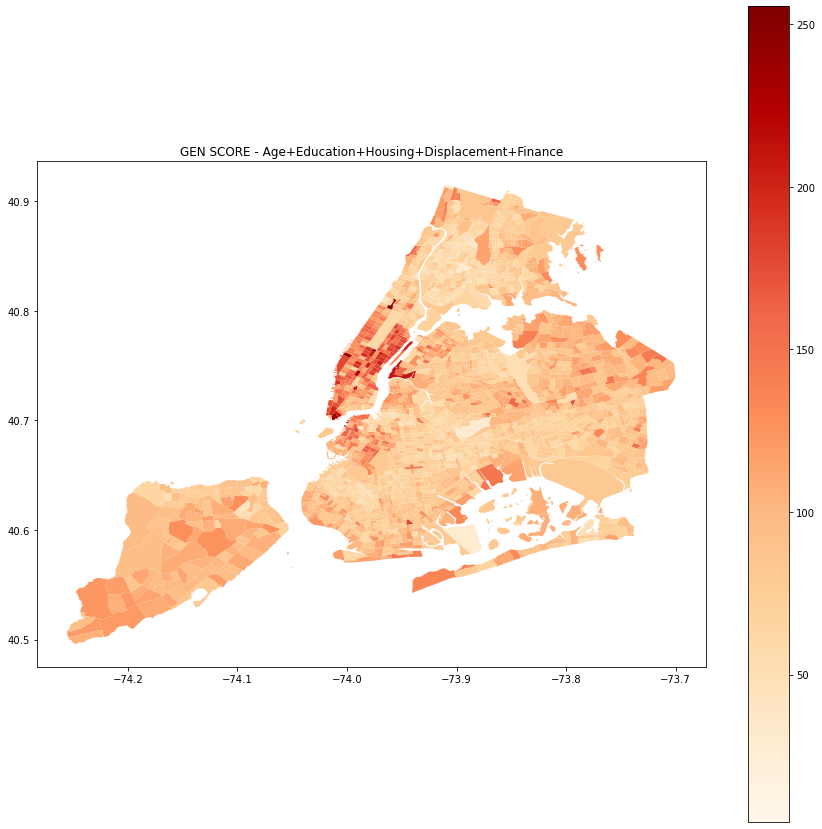

In [115]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='OrRd')
plt.title('GEN SCORE - Age+Education+Housing+Displacement+Finance')

In [116]:
#Scaling genscore - 0-100
gdf_2010['gen_score'] = scaler.fit_transform(gdf_2010[['gen_score']]) 

Text(0.5, 1.0, 'GEN SCORE Scaled 0-100- Age+Education+Housing+Displacement+Finance')

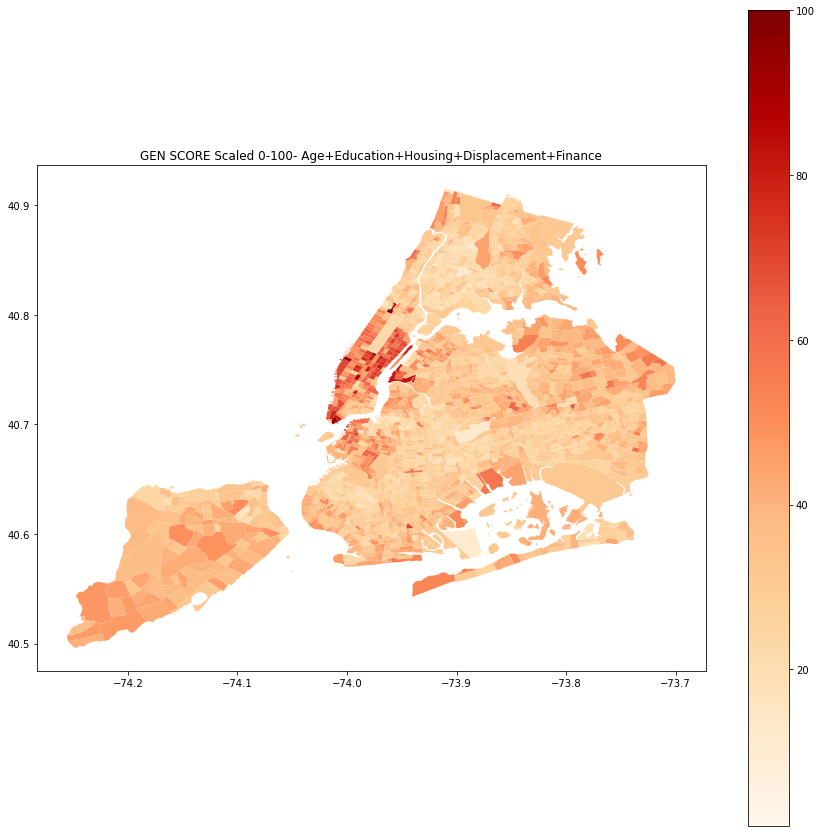

In [117]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='OrRd')
plt.title('GEN SCORE Scaled 0-100- Age+Education+Housing+Displacement+Finance')

In [119]:
#Scaling genscore - 0-10
gdf_2010['gen_score'] = scaler10.fit_transform(gdf_2010[['gen_score']]) 

Text(0.5, 1.0, 'GEN SCORE Scaled 0-10- Age+Education+Housing+Displacement+Finance')

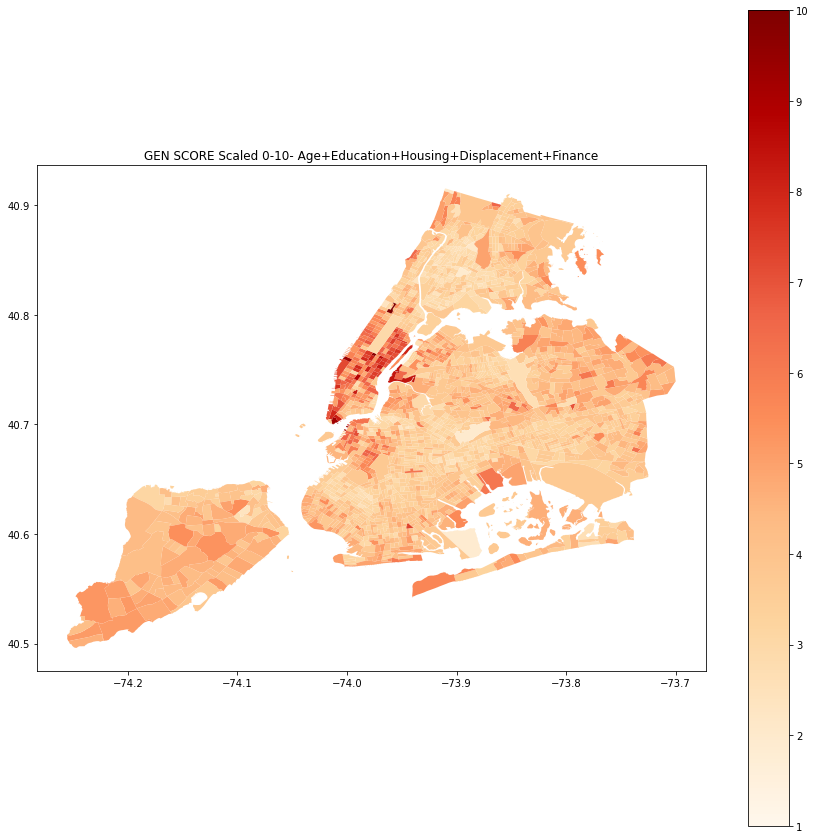

In [120]:
fig,ax = plt.subplots(figsize=(15,15))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='OrRd')
plt.title('GEN SCORE Scaled 0-10- Age+Education+Housing+Displacement+Finance')

Text(0.5, 1.0, 'GEN SCORE Scaled 0-10- Age+Education+Housing+Displacement+Finance')

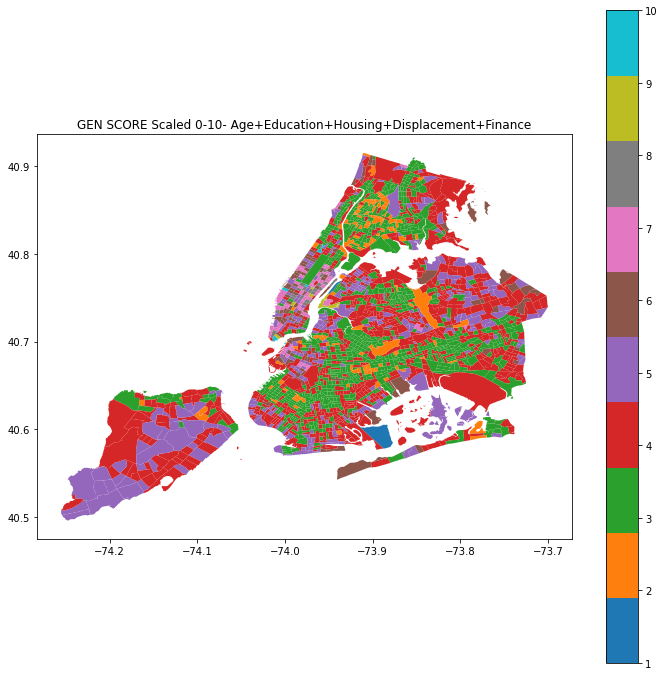

In [129]:
#cmap with good info - tab10,Spectral

fig,ax = plt.subplots(figsize=(12,12))
gdf_2010.plot(column='gen_score',ax=ax,legend=True,cmap='tab10')
plt.title('GEN SCORE Scaled 0-10- Age+Education+Housing+Displacement+Finance')